# CS624 Final Project

## Read the data for Feature Selection and Standardization

In [0]:
import pandas as pd
import seaborn as sns
import json

#Pyspark
from pyspark.sql import SparkSession
from pyspark.sql.types import StructType, StructField, StringType,DoubleType,DateType,IntegerType
from pyspark.sql.functions import mean, min, max, stddev, regexp_replace,trim
from pyspark.sql import functions as F
from pyspark.sql.functions import col, isnan, when, trim
from pyspark.sql.functions import avg, col, lit, when, lag,sum, row_number
from pyspark.sql.window import Window
from pyspark import SparkConf

#Pyspark ML
from pyspark.ml.regression import RandomForestRegressor
import matplotlib.pyplot as plt
from pyspark.ml.feature import VectorAssembler, StandardScaler

#Mlfow
import mlflow
import mlflow.spark
from mlflow.models.signature import infer_signature

In [0]:
spark

In [0]:
class DataParquet:
    def __init__(self, app_name="DataParquet"):
        """
        Initializes a Spark session.

        Args:
        - app_name: Name of the Spark application.
        """
        conf = SparkConf()
        conf.set("spark.executor.memory", "20g")
        conf.set("spark.driver.memory", "10g")
        conf.set("spark.executor.cores", "4")
        conf.set("spark.default.parallelism", "200")
        conf.set("spark.sql.shuffle.partitions", "200")
        conf.set("spark.executor.extraJavaOptions", "-XX:+UseG4GC")
        conf.set("spark.dynamicAllocation.enabled", "true")
        conf.set("spark.shuffle.service.enabled", "true")
        conf.set("spark.memory.fraction", "0.7")
        conf.set("spark.memory.storageFraction", "0.5")
        self.spark = SparkSession.builder \
            .appName(app_name) \
            .config(conf=conf) \
            .getOrCreate()


    def read_parquet(self, file_path, header=True, infer_schema=True):
        """
        Reads a Parquet file into a DataFrame.

        Args:
        - file_path: Path to the Parquet file.
        - header: Whether the Parquet file has a header row.
        - infer_schema: Whether to infer the data types of columns.

        Returns:
        - DataFrame: The DataFrame containing the Parquet data.
        """
       
        return self.spark.read.parquet(file_path, header=header, inferschema=True)


    
    def ChangeDataType(self,clean_data):
        schema = StructType([
        StructField("Date", DateType(), True),
        StructField("Open", DoubleType(), True),
        StructField("High", DoubleType(), True),
        StructField("Low", DoubleType(), True),
        StructField("Close", DoubleType(), True),
        StructField("Year", IntegerType(), True)
        ])
        new_data = clean_data.select(
        [clean_data[col_name].cast(schema[col_name].dataType).alias(col_name) for col_name in clean_data.columns])
        return new_data


    def stop(self):
        """
        Stops the Spark session.
        """
        self.spark.stop()



In [0]:
dp = DataParquet(app_name="DataParquet")
URL="/FileStore/tables/parquet_data/data_smoothening_spark.parquet"
feature_df = dp.read_parquet(URL)
feature_df.display()

Timestamp,Open,High,Low,Close,VolBTC,VolCurrency,Weighted_Price,Timestamp_new,date,time,hour,day_of_week,year,Open_sma_7,Open_sma_30,Open_sma_90,High_sma_7,High_sma_30,High_sma_90,Low_sma_7,Low_sma_30,Low_sma_90,Weighted_Price_sma_7,Weighted_Price_sma_30,Weighted_Price_sma_90,Open_ema_7,Open_ema_30,Open_ema_90,High_ema_7,High_ema_30,High_ema_90,Low_ema_7,Low_ema_30,Low_ema_90,Weighted_Price_ema_7,Weighted_Price_ema_30,Weighted_Price_ema_90,Open_var_7,Open_var_30,Open_var_90,High_var_7,High_var_30,High_var_90,Low_var_7,Low_var_30,Low_var_90,Weighted_Price_var_7,Weighted_Price_var_30,Weighted_Price_var_90,Open_std_7,Open_std_30,Open_std_90,High_std_7,High_std_30,High_std_90,Low_std_7,Low_std_30,Low_std_90,Weighted_Price_std_7,Weighted_Price_std_30,Weighted_Price_std_90
1495494960,2045.0,2045.0,2039.0,2039.0,1.341796875,2736.4296875,2039.0,2017-05-22T00:00:00Z,2017-05-22,23:16:00,23,2,2017,2106.1428571428573,2006.5,1837.6333333333334,2108.4285714285716,2008.6,1839.3111111111111,2101.5714285714284,2004.6,1836.2,2105.285714285714,2006.4,1837.7555555555555,2088.869104041503,2005.7772314054162,1851.040828069174,2090.6445632299706,2007.7631757838017,1852.68703590744,2084.5994297194366,2003.1994077993327,1849.3122616923308,2087.2594685836257,2005.3480831141576,1850.9351329803633,2672.809547616757,5268.603450244023,17462.931456418082,2845.9523966146535,5345.696543718568,17552.59875307867,2481.2856967311513,5023.213763801087,17296.453940095802,2592.238094633383,5198.110317928381,17407.063164781077,51.69922192467462,72.58514620942789,132.14738535596564,53.34746851177339,73.11427045193413,132.48622099327412,49.81250542515555,70.87463413521856,131.5159835917133,50.91402650187258,72.09792173099292,131.93582972332072
1495499220,2128.0,2130.0,2128.0,2130.0,12.5625,26741.853515625,2128.0,2017-05-23T00:00:00Z,2017-05-23,00:27:00,0,3,2017,2117.285714285714,2014.0666666666666,1841.9,2119.8571428571427,2016.2333333333333,1843.588888888889,2112.714285714286,2012.1666666666667,1840.4888888888888,2116.4285714285716,2013.9666666666667,1842.0222222222221,2098.651828031127,2013.6625713147441,1857.1278428368844,2100.483422422478,2015.6494225074275,1858.7818263270567,2095.449572289577,2011.2510589090532,1855.4372669298618,2097.444601437719,2013.2611100100185,1857.0244707170584,2082.2381190391975,5334.616093922164,18293.349433943706,2202.142872801806,5394.391946015755,18383.593135100396,2009.5714110198276,5118.971235067796,18134.85943322979,2023.9523803476911,5265.6884788569605,18236.426460663846,45.63154741008897,73.03845626738125,135.25290915149924,46.926995139277835,73.44652439711327,135.58610966872823,44.828243452312826,71.54698620534478,134.66573221584542,44.988358275754976,72.56506376250874,135.04231359342094
1495532160,2136.0,2142.0,2134.0,2142.0,18.078125,38658.52734375,2138.0,2017-05-23T00:00:00Z,2017-05-23,09:36:00,9,3,2017,2118.4285714285716,2022.0,1845.8555555555556,2121.5714285714284,2024.3666666666666,1847.611111111111,2113.5714285714284,2020.0333333333333,1844.4222222222222,2117.8571428571427,2021.9666666666667,1846.0,2107.9888710233454,2021.5553086492769,1863.2569012360736,2110.8625668168584,2023.8010726682387,1865.006401572616,2105.087179217183,2019.17034543105,1861.5595247995352,2107.5834510782893,2021.308780331953,1863.1997570749252,2119.9524047528553,5317.655174381912,19206.327211719195,2263.285729944167,5389.343670151913,19322.35268566149,2045.2856967343403,5117.343648863332,19046.066923866867,2076.809523204836,5266.240203004449,19161.505611727458,46.04294087862824,72.92225431500258,138.58689408352868,47.5740026689385,73.41214933614131,139.00486569059908,45.224834955302384,71.53561105395922,138.00748865140204,45.57202566492778,72.56886524539604,138.42509025363668
1495535040,2146.0,2154.0,2146.0,2150.0,2.162109375,4644.1806640625,2148.0,2017-05-23T00:00:00Z,2017-05-23,10:24:00,10,3,2017,2126.1428571428573,2029.9,1850.111111111111,2129.5714285714284,2032.5333333333333,1851.9333333333334,2122.714285714286,2027.9333333333334,1848.6777777777

## Droping NANs and Duplicates

In [0]:
feature_df_na = feature_df.na.drop("any")
feature_data_unique=feature_df_na.dropDuplicates()
feature_data_unique.display()

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$3(SequenceExecutionState.scala:103)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$2(SequenceExecutionState.scala:103)
	at com.databricks.spark.chauffeur.SequenceExecutionState.$anonfun$cancel$2$adapted(SequenceExecutionState.scala:100)
	at scala.collection.immutable.Range.foreach(Range.scala:158)
	at com.databricks.spark.chauffeur.SequenceExecutionState.cancel(SequenceExecutionState.scala:100)
	at com.databricks.spark.chauffeur.ExecContextState.cancelRunningSequence(ExecContextState.scala:714)
	at com.databricks.spark.chauffeur.ExecContextState.$anonfun$cancel$1(ExecContextState.scala:430)
	at scala.Option.getOrElse(Option.scala:189)
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:430)
	at com.databricks.spark.chauffeur.ChauffeurState.cancelExecutio

## Feature Selection Using Random Forest

In [0]:
class FeatureSelection:

    def SelectBest20Features(self,feature_data_unique):

        mlflow.pyspark.ml.autolog()

        with mlflow.start_run(run_name='Feature Selection'):

            cols_to_exclude = ['Timestamp', 'Timestamp_new', 'date','time','hour','day_of_week','year','VolBTC','VolCurrency']  # Explicitly excluding the target her
            selected_cols = [col for col in feature_data_unique.columns if col not in cols_to_exclude]

            df_selected = feature_data_unique.select(selected_cols)
            assembler = VectorAssembler(inputCols=selected_cols, outputCol="features")
            df_assembled = assembler.transform(df_selected)

            # Create a RandomForestRegressor
            rf = RandomForestRegressor(featuresCol="features", labelCol="Close", numTrees=10)

            # Fit the model
            model = rf.fit(df_assembled)

            # Extract feature importance
            feature_importances = model.featureImportances
            feature_names = selected_cols

            importance_dict = dict(zip(feature_names, feature_importances))
            # Log feature importances as JSON
            with open("feature_importances.json", "w") as f:
                json.dump(importance_dict, f)
            mlflow.log_artifact("feature_importances.json")
    
            
        return feature_importances,feature_names


fe =FeatureSelection()

In [0]:
feature_importances,feature_names =fe.SelectBest20Features(feature_data_unique)


2024/04/21 06:50:20 WARNING mlflow.data.spark_dataset: Failed to infer schema for Spark dataset. Exception: Unsupported Spark Type '<class 'pyspark.ml.linalg.VectorUDT'>', MLflow schema is only supported for scalar Spark types.
2024/04/21 07:02:31 WARNING mlflow.pyspark.ml: Model inputs contain unsupported Spark data types: [StructField('features', VectorUDT(), True)]. Model signature is not logged.
2024/04/21 07:02:39 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().


2024/04/21 07:02:40 INFO mlflow.store.artifact.artifact_repo: The progress bar can be disabled by setting the environment variable MLFLOW_ENABLE_ARTIFACTS_PROGRESS_BAR to false
2024/04/21 07:03:20 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/3962116924833114/d19a73352812462b86192cb323801e5c/artifacts/model/sparkml, flavor: spark), fall back to return ['pyspark==3.5.0']. Set logging level to DEBUG to see the full traceback.


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

## Plot best features

In [0]:
class PlotFeatures:

    def Plot20Features(self,feature_importances,feature_names):
        # Sort features by importance scores
        sorted_indices = sorted(range(len(feature_importances)), key=lambda i: feature_importances[i - 1], reverse=True)
        sorted_feature_importances = [feature_importances[i] for i in sorted_indices]
        sorted_feature_names = [feature_names[i] for i in sorted_indices]

        # Slice to include only the top 20 features
        top_n = 20
        sorted_feature_importances = sorted_feature_importances[:top_n]
        sorted_feature_names = sorted_feature_names[:top_n]

        # Exclude 'Close' feature
        top_features = [feat for feat in sorted_feature_names if feat != 'Close'][:top_n]
        # Corresponding importances for the top features
        top_importances = [importance for importance, feat in zip(sorted_feature_importances, sorted_feature_names) if feat != 'Close'][:top_n]

        # Create DataFrame for plotting
        importance_df = pd.DataFrame({'Feature': top_features, 'Importance': top_importances})

        # Sort DataFrame by Importance
        importance_df = importance_df.sort_values(by='Importance', ascending=False)

        # Create bar plot
        plt.figure(figsize=(15, 8))
        sns.barplot(x='Feature', y='Importance', data=importance_df)
        plt.xlabel('Feature')
        plt.ylabel('Importance Score')
        plt.title('Top 20 Feature Importance')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.show() 

pfe = PlotFeatures()

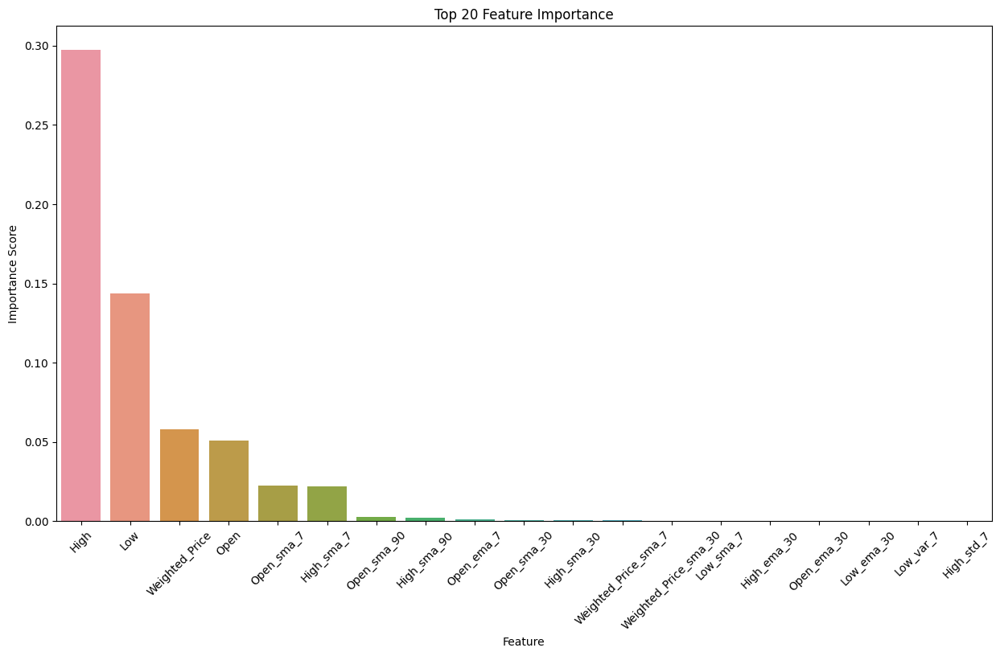

In [0]:

pfe.Plot20Features(feature_importances,feature_names)


## Selecting features and labels for machine learning

In [0]:
# Assuming df is your PySpark DataFrame
selected_columns = ['High','Low','Weighted_Price','Open','Open_sma_7','High_sma_7','Open_sma_90','High_sma_90','Open_ema_7','Open_sma_30','High_sma_30','Weighted_Price_sma_7','Weighted_Price_sma_30','Low_sma_7','High_ema_30','Open_ema_30','Low_ema_30','Low_var_7','High_std_7','Close']  

# Select specific columns
feature_df = feature_data_unique.select(*selected_columns)
feature_df.display()

High,Low,Weighted_Price,Open,Open_sma_7,High_sma_7,Open_sma_90,High_sma_90,Open_ema_7,Open_sma_30,High_sma_30,Weighted_Price_sma_7,Weighted_Price_sma_30,Low_sma_7,High_ema_30,Open_ema_30,Low_ema_30,Low_var_7,High_std_7,Close
225.625,225.5,225.625,225.5,225.66071428571428,225.80357142857142,234.9875,235.2625,225.60791280043853,225.86666666666667,226.02916666666667,225.71428571428572,225.90416666666667,225.60714285714286,225.36371042516507,225.2152030419587,225.1056851002043,8.564714087003976,2.985084672934042,225.625
248.75,248.125,248.25,248.75,248.23214285714286,248.28571428571428,270.28055555555557,270.40555555555557,248.07997900456706,254.50833333333333,254.575,248.17857142857142,254.375,248.125,253.20158738063782,253.1438881300851,252.95399403153715,3.317690283490771,1.8110157693913191,248.125
255.375,254.25,254.5,255.375,256.10714285714283,256.14285714285717,251.54583333333332,251.5875,255.8300802138766,252.875,252.89583333333334,255.98214285714286,252.83333333333334,255.91071428571428,253.53430273387534,253.50759133688322,253.37680787093655,2.576618857001512,1.5653002968812175,254.5
225.5,225.5,225.5,225.5,224.42857142857142,224.46428571428572,227.56666666666666,227.65972222222223,224.4876337434326,225.99583333333334,226.07916666666668,224.41071428571428,226.02083333333334,224.33928571428572,225.47073210554439,225.39379176327793,225.32458403312387,0.6443271818918318,0.8123955055171668,225.5
229.875,229.75,229.875,229.75,229.44642857142858,229.5,227.10833333333332,227.17916666666667,229.52638095424646,229.05833333333334,229.13333333333333,229.42857142857142,229.06666666666666,229.375,228.72489237438342,228.6621613209352,228.61731578520386,0.260398611809632,0.5154039365373926,229.875
239.375,239.375,239.375,239.375,238.05357142857142,238.08928571428572,232.46805555555557,232.5388888888889,238.0327126370981,235.7625,235.7875,238.07142857142858,235.70416666666668,238.05357142857142,235.78066884026669,235.74047075952632,235.62908580146805,1.0044462331303652,0.9835029842675413,239.375
271.5,271.0,271.0,271.0,269.07142857142856,269.25,244.80555555555554,244.8972222222222,268.59188252051626,255.87083333333334,256.0083333333333,269.07142857142856,255.8375,269.0,258.38314671515525,258.20951909988804,258.0377639480434,9.895815289024268,3.246795785492326,271.5
422.0,418.25,419.25,422.0,439.10714285714283,439.5,390.0388888888889,390.2055555555556,431.79999462581014,420.18333333333334,420.4166666666667,438.5357142857143,419.975,437.5,419.9924612342326,419.7630450062844,418.93790117105704,258.12498200097957,16.380883660187312,419.75
416.5,416.5,416.5,416.5,428.0357142857143,428.39285714285717,446.03055555555557,446.2416666666667,427.5853496380929,440.39166666666665,440.51666666666665,427.75,440.30833333333334,427.2857142857143,440.13497845529446,439.9134611720841,439.5592425374956,83.88391056964586,9.034491682884063,416.5
382.25,382.25,382.25,382.25,384.7142857142857,384.92857142857144,422.1277777777778,422.3305555555556,384.1572222826028,385.775,386.1333333333333,384.75,385.85,384.64285714285717,391.21612892077815,390.95347046543066,390.7654361993338,1.5803391295674387,1.3047594122673594,382.25


## Data Standardization

In [0]:

class DataStandardization:
    def FeatureStandardize(self,feature_df,label='Close'):

        mlflow.pyspark.ml.autolog()

        with mlflow.start_run(run_name='Standardization of dataset'):
            # Select features and target
            assembler = VectorAssembler(inputCols=feature_df.columns, outputCol="features")
            df_assembled = assembler.transform(feature_df).select("features", label)
            # Standardize features
            scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withMean=True, withStd=True)
            scaler_model = scaler.fit(df_assembled)
            df_scaled = scaler_model.transform(df_assembled).select("scaled_features", label)
        return df_scaled
    
ds = DataStandardization()

In [0]:
df_scaled=ds.FeatureStandardize(feature_df)


In [0]:
df_scaled.write.mode("overwrite").parquet("/FileStore/tables/parquet_data/standard_data.parquet", compression="snappy") 

In [0]:
%fs ls /FileStore/tables/parquet_data/standard_data.parquet

path,name,size,modificationTime
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/_SUCCESS,_SUCCESS,0,1713683624000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/_committed_3018246421626962883,_committed_3018246421626962883,3957,1713656711000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/_committed_7705279843365979444,_committed_7705279843365979444,5993,1713683624000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/_started_7705279843365979444,_started_7705279843365979444,0,1713683558000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/part-00000-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8864-1-c000.snappy.parquet,part-00000-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8864-1-c000.snappy.parquet,23420476,1713683622000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/part-00001-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8854-1-c000.snappy.parquet,part-00001-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8854-1-c000.snappy.parquet,23411217,1713683603000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/part-00002-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8858-1-c000.snappy.parquet,part-00002-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8858-1-c000.snappy.parquet,23439533,1713683603000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/part-00003-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8850-1-c000.snappy.parquet,part-00003-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8850-1-c000.snappy.parquet,23493599,1713683579000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/part-00004-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8855-1-c000.snappy.parquet,part-00004-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8855-1-c000.snappy.parquet,23489251,1713683604000
dbfs:/FileStore/tables/parquet_data/standard_data.parquet/part-00005-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8853-1-c000.snappy.parquet,part-00005-tid-7705279843365979444-ec8ffc9b-71b2-4497-be32-d8486c203edf-8853-1-c000.snappy.parquet,23574339,1713683598000
